## News Stream

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sovai as sov
sov.token_auth(token="your_token")

#### Processed Dataset

In [45]:
df_news = sov.data("news/daily", tickers=["MSFT","TSLA", "AAPL","NVDA"]); df_news.tail()

match_quality  within_article  relevance  \
ticker date                                                                   
TSLA   2024-08-08 18:14:44.023252         98.062           2.000      0.042   
       2024-08-09 18:15:28.421860         98.284           2.000      0.025   
       2024-08-11 18:14:47.102266         98.067           3.000      0.035   
       2024-08-12 18:15:49.239031         98.829           4.000      0.037   
       2024-08-13 18:18:57.585832         99.100           2.000      0.017   

                                   magnitude  sentiment  article_count  \
ticker date                                                              
TSLA   2024-08-08 18:14:44.023252     16.024     -0.113        431.000   
       2024-08-09 18:15:28.421860     10.647     -0.115        492.000   
       2024-08-11 18:14:47.102266     16.999     -0.056        170.000   
       2024-08-12 18:15:49.239031     15.222     -0.123        507.000   
       2024-08-13 18:18:57.585832     15.276     -0.191        921.000   

                                   associated_people  associated_companies  \
ticker date                                                                  
TSLA   2024-08-08 18:14:44.023252            211.000               191.000   
       2024-08-09 18:15:28.421860             96.000                93.000   
       2024-08-11 18:14:47.102266            108.000               166.000   
       2024-08-12 18:15:49.239031             97.000               142.000   
       2024-08-13 18:18:57.585832            135.000               103.000   

                                    tone  positive  negative  polarity  \
ticker date                                                              
TSLA   2024-08-08 18:14:44.023252 -0.866     2.561     3.427     5.988   
       2024-08-09 18:15:28.421860 -1.362     2.212     3.574     5.786   
       2024-08-11 18:14:47.102266 -0.220     2.949     3.169     6.118   
       2024-08-12 18:15:49.239031 -0.939     2.787     3.726     6.512   
       2024-08-13 18:18:57.585832 -2.279     2.378     4.658     7.036   

                                   activeness  pronouns  word_count  
ticker date                                                          
TSLA   2024-08-08 18:14:44.023252      22.376     0.728         881  
       2024-08-09 18:15:28.421860      21.291     0.498         604  
       2024-08-11 18:14:47.102266      23.001     0.791         949  
       2024-08-12 18:15:49.239031      22.601     0.844         795  
       2024-08-13 18:18:57.585832      23.173     0.847         771

In [32]:
sov.plot("news", chart_type="strategy", ticker='NVDA')

Plotting for random tickers. Specify tickers to plot specific data.


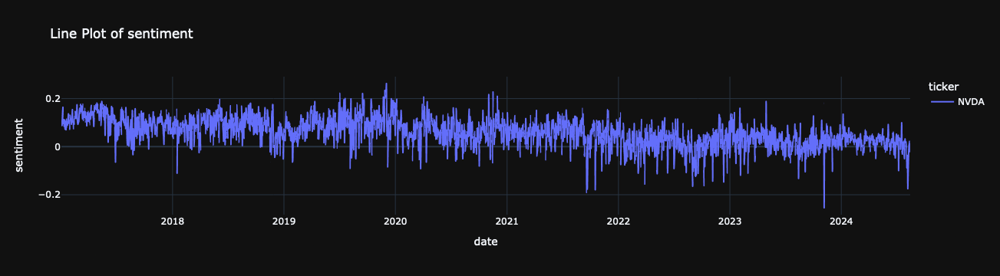

In [4]:
df_news.ticker("NVDA").plot_line("sentiment")

Plotting for random tickers. Specify tickers to plot specific data.


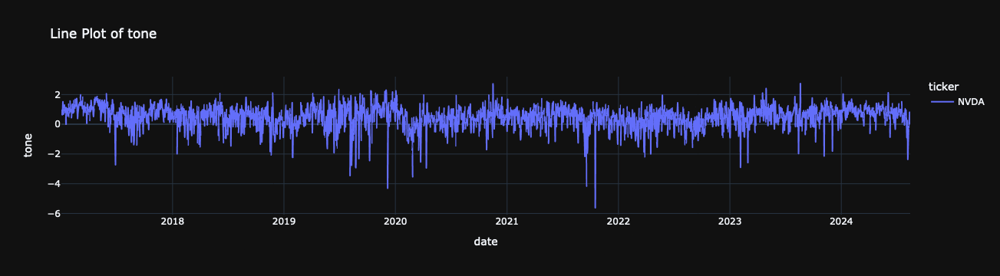

In [5]:
df_news.ticker("NVDA").plot_line("tone")

Plotting for random tickers. Specify tickers to plot specific data.


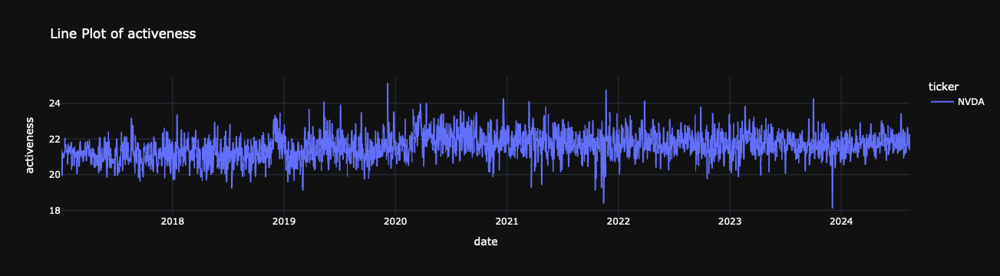

In [6]:
df_news.ticker("NVDA").plot_line("activeness")

Plotting for random tickers. Specify tickers to plot specific data.


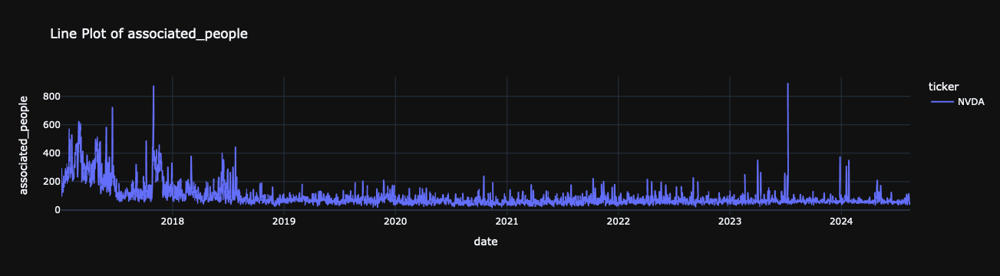

In [7]:
df_news.ticker("NVDA").plot_line("associated_people")

In [35]:
all_news = sov.data("news/daily", columns=["sentiment","tone"])

In [46]:
df_sentiment = sov.data("news/sentiment")

In [48]:
df_sentiment

sentiment
ticker   date                 
0077943D 2017-01-04      0.045
         2017-01-06      0.000
         2017-01-19      0.000
         2017-02-14      0.150
         2017-03-02      0.152
...                        ...
ZZLL     2024-07-26      0.110
         2024-08-04     -0.040
         2024-08-05     -0.020
         2024-08-08      0.000
         2024-08-13     -0.060

[26764238 rows x 1 columns]

In [49]:
df_tone = sov.data("news/tone")

In [50]:
df_tone

tone
ticker   date             
0077943D 2017-01-04 -0.439
         2017-01-06  0.871
         2017-01-19  2.018
         2017-02-14 -0.405
         2017-03-02  0.875
...                    ...
ZZLL     2024-07-26  1.796
         2024-08-04  2.131
         2024-08-05 -0.828
         2024-08-08  0.000
         2024-08-13 -1.038

[26764238 rows x 1 columns]

In [44]:
sov.report("news", report_type="econometric")

### Time Series Topic Modelling

In [53]:
df_sentiment = sov.data("news/sentiment_score")
df_polarity = sov.data("news/polarity_score")
df_topic = sov.data("news/topic_probability")

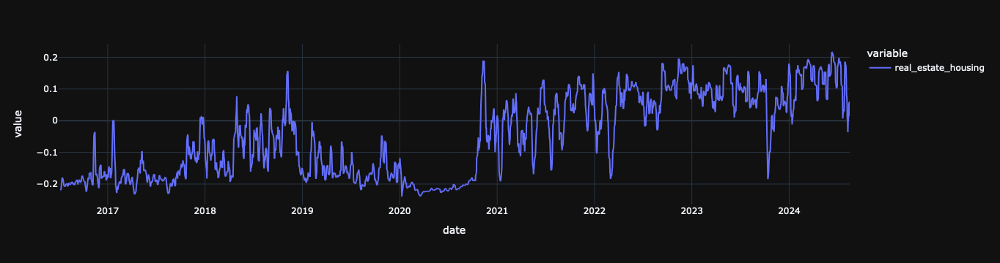

In [54]:
df_sentiment.query("calculation == 'sentiment_score_median'").set_index("date")["real_estate_housing"].rolling(7).mean().plot()

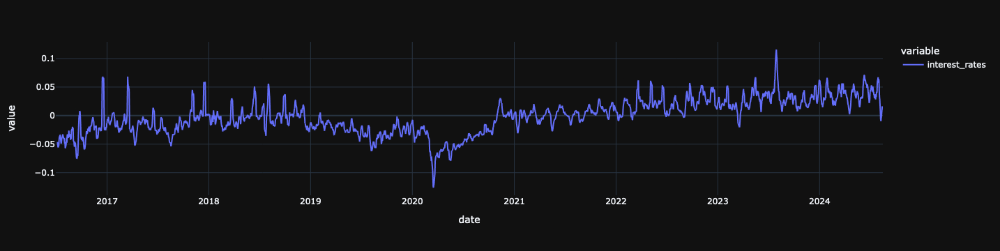

In [66]:
df_sentiment.query("calculation == 'sentiment_score_mean'").set_index("date")["interest_rates"].rolling(7).mean().plot()

In [60]:
sov.plot("news", chart_type="analysis")

In [56]:
run_dash_news_ts()

#### Let's train a machine learning model using this data (4 mins)

In [79]:
df_sentiment.columns

Index(['date', 'calculation', 'monetary_policy', 'fiscal_policy',
       'economic_growth', 'inflation', 'interest_rates', 'business_cycles',
       'government_debt_deficit', 'quantitative_easing',
       ...
       'financial_stability', 'systemic_risk', 'short_selling',
       'leveraged_buyouts', 'distressed_debt', 'angel_investing',
       'crowdfunding', 'supply_chain_management',
       'central_bank_digital_currencies', 'market_sentiment'],
      dtype='object', length=108)

In [63]:
import pandas as pd
import numpy as np
import yfinance as yf
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel
import lightgbm as lgb
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import warnings

# Suppress all warnings
warnings.filterwarnings('ignore')

# Set pandas options to avoid warnings
pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', None)

# Fetch S&P 500 data
sp500 = yf.download('^GSPC', start='2016-01-01', end='2024-08-09')
sp500['return'] = sp500['Close'].pct_change()
sp500['forward_return'] = sp500['return'].shift(-22)  # 5 trading days ≈ 1 week
sp500['direction'] = (sp500['forward_return'] > 0).astype(int)

# Function to reshape dataframe
def reshape_dataframe(df):
    df = df.reset_index()
    df_reshaped = df.pivot(index='date', columns='calculation', values=[col for col in df.columns if col not in ['date', 'calculation']])
    df_reshaped.columns = [f'{col[0]}_{col[1]}' for col in df_reshaped.columns]
    return df_reshaped

# Reshape dataframes
df_sentiment_reshaped = reshape_dataframe(df_sentiment)
df_polarity_reshaped = reshape_dataframe(df_polarity)
df_topic_reshaped = reshape_dataframe(df_topic)

# Combine all dataframes
all_dfs = [sp500, df_sentiment_reshaped, df_polarity_reshaped, df_topic_reshaped]
df_combined = pd.concat(all_dfs, axis=1, join='outer')


# Handle missing values
df_combined = df_combined.ffill().bfill()

# df_combined = df_combined[df_combined.index<"2024-08-01"] -> that is crazy it predict august.

# Create rolling features
rolling_windows = [5, 10, 20]
for col in df_combined.columns:
    if col not in ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'return', 'forward_return', 'direction']:
        for window in rolling_windows:
            df_combined[f'{col}_rolling_{window}'] = df_combined[col].rolling(window=window).mean()

# Prepare features and target
feature_cols = [col for col in df_combined.columns if col not in ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'return', 'forward_return', 'direction']]
X = df_combined[feature_cols].dropna()
y = df_combined['direction'].loc[X.index]

# Scale the features
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

# Feature selection
selector = SelectFromModel(lgb.LGBMClassifier(random_state=42), max_features=50)
selector.fit(X_scaled, y)
selected_features = X_scaled.columns[selector.get_support()].tolist()
X_selected = X_scaled[selected_features]

# Set up TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

# Initialize lists to store performance metrics
metrics = {
    'accuracies': [],
    'precisions': [],
    'recalls': [],
    'f1_scores': []
}

# LightGBM parameters
params = {
    'objective': 'binary',
    'metric': 'binary_logloss',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.01,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'reg_alpha': 0.1,
    'reg_lambda': 0.1,
    'n_estimators': 100,
    'random_state': 42
}



# Train final model on all data
final_train_data = lgb.Dataset(X_selected, label=y)
final_model = lgb.train(params, final_train_data)



# Make predictions on the entire dataset
df_combined.loc[X_selected.index, 'prob_increase'] = final_model.predict(X_selected)

# Calculate the latest prediction
latest_features = X_selected.iloc[-1].values.reshape(1, -1)
latest_prediction = final_model.predict(latest_features)[0]


[*********************100%%**********************]  1 of 1 completed


[LightGBM] [Info] Number of positive: 1642, number of negative: 1432
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.346940 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3485388
[LightGBM] [Info] Number of data points in the train set: 3074, number of used features: 14124
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.534157 -> initscore=0.136843
[LightGBM] [Info] Start training from score 0.136843
[LightGBM] [Info] Number of positive: 1642, number of negative: 1432
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12327
[LightGBM] [Info] Number of data points in the train set: 3074, number of used features: 50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.534157 -> initscore=0.136843
[LightGBM] [Info] Start training from score 0.136843


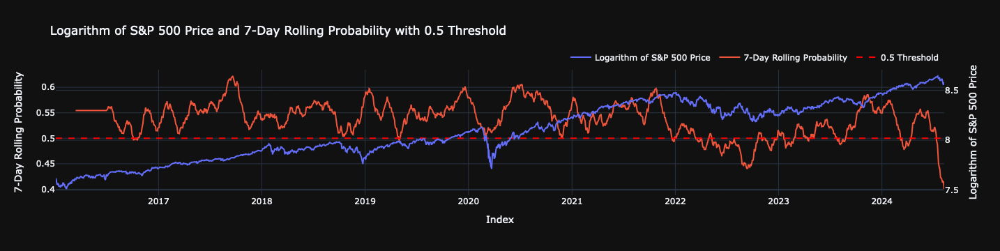

In [67]:
import numpy as np
import plotly.graph_objects as go

# Calculate the logarithm of the S&P 500 price
sp500['log_price'] = np.log(sp500['Close'])

# Calculate the 7-day rolling average for the predicted probability
df_combined['prob_increase_rolling'] = df_combined['prob_increase'].rolling(window=30).mean()

# Align the indices of sp500 and df_combined
df_combined = df_combined.reindex(sp500.index)

# Prepare the data for plotting
df_plot = df_combined[["prob_increase_rolling"]].copy()
df_plot['log_price'] = sp500['log_price']

# Create a figure
fig = go.Figure()

# Add the primary y-axis plot for the logarithm of the S&P 500 price
fig.add_trace(go.Scatter(x=df_plot.index, y=df_plot['log_price'], mode='lines', name='Logarithm of S&P 500 Price', yaxis='y2'))

# Add the secondary y-axis plot for the 7-day rolling average of predicted probability
fig.add_trace(go.Scatter(x=df_plot.index, y=df_plot['prob_increase_rolling'], mode='lines', name='7-Day Rolling Probability'))

# Add a horizontal line at 0.5 on the secondary y-axis
fig.add_trace(go.Scatter(
    x=df_plot.index, 
    y=[0.5]*len(df_plot), 
    mode='lines', 
    name='0.5 Threshold', 
    line=dict(dash='dash', color='red'),
))

# Set up the layout to include a secondary y-axis and other essential elements
fig.update_layout(
    yaxis=dict(
        title='7-Day Rolling Probability'
    ),
    yaxis2=dict(
        title='Logarithm of S&P 500 Price',
        overlaying='y',
        side='right',
        # range=[0, 1]  # Set range for probability axis
    ),
    xaxis=dict(
        title='Index'
    ),
    title='Logarithm of S&P 500 Price and 7-Day Rolling Probability with 0.5 Threshold',
    legend=dict(
        orientation="h",  # Horizontal legend
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    hovermode="x unified"  # Unified hover mode for easier comparison
)

# Show the plot
fig.show()


In [69]:
df_polarity_percentile

,date,calculation,monetary_policy,fiscal_policy,economic_growth,inflation,interest_rates,business_cycles,government_debt_deficit,quantitative_easing,monetary_policy_transmission,international_trade,emerging_economies,international_monetary_system,international_finance,trade_agreements,foreign_direct_investment,migration_remittances,sanctions_embargoes,foreign_exchange_markets,energy_resources,healthcare_pharma,real_estate_housing,consumer_spending_retail,manufacturing_industrial,transportation_logistics,telecom_internet,tourism_hospitality,agriculture_food,aerospace_defense,utilities_public_services,mining_extraction,chemicals_materials,forestry_paper_products,fishing_aquaculture,textiles_apparel,luxury_goods_services,sports_entertainment,media_publishing,education_services,consulting_business_services,legal_services_regulations,waste_management_recycling,artificial_intelligence,robotics_automation,cybersecurity_data_privacy,cryptocurrency_blockchain,quantum_computing_crypto,technology_innovation,intellectual_property_patents,nanotech_advanced_materials,space_commercialization_exploration,renewable_energy,digital_economy,financial_technology_fintech,robo_advisors,high_frequency_trading,algorithmic_trading,environmental_sustainability,climate_change,income_inequality,human_rights_business,poverty_alleviation,sustainable_development,financial_inclusion,circular_economy,economic_inequality,welfare_inequality,international_development_aid,nonprofit_charitable_orgs,labor_market,labor_productivity,education_human_capital,demographic_shifts_aging,sharing_economy_gig_work,small_business_entrepreneurship,geopolitical_events,public_health_disease_control,urbanization_city_planning,infrastructure,financial_markets_investing,insurance_risk_management,economic_forecasting_modeling,corporate_governance,market_regulation,antitrust_competition_policy,commodities_markets,private_equity_venture_capital,sovereign_wealth_funds,pension_funds,hedge_funds,exchange_traded_funds,mergers_acquisitions,initial_public_offerings,bond_markets,derivative_markets,yield_curve,credit_ratings,financial_stability,systemic_risk,short_selling,leveraged_buyouts,distressed_debt,angel_investing,crowdfunding,supply_chain_management,central_bank_digital_currencies,market_sentiment
0,2016-07-01,polarity_score_mean,-0.018,-0.052,-0.002,-0.018,-0.012,-0.014,-0.044,-0.022,-0.016,-0.024,-0.046,-0.027,-0.070,-0.020,-0.034,-0.076,-0.464,-0.017,0.058,-0.036,-0.002,0.001,0.052,0.002,0.025,-0.006,0.020,-0.244,-0.024,0.025,0.051,0.004,-0.020,-0.013,-0.013,-0.118,-0.058,-0.006,-0.002,-0.176,-0.005,-0.017,-0.010,-0.154,-0.000,-0.021,0.032,-0.011,0.020,-0.091,0.068,-0.007,-0.015,-0.024,-0.014,-0.018,-0.023,-0.072,-0.007,-0.202,-0.031,-0.021,-0.000,-0.030,-0.022,-0.009,-0.216,-0.038,-0.062,-0.049,-0.000,-0.018,-0.010,0.011,-0.211,-0.025,-0.005,-0.007,0.092,-0.023,-0.022,-0.023,-0.006,-0.072,-0.027,0.018,-0.053,-0.038,-0.016,-0.010,0.016,-0.033,-0.029,-0.019,-0.023,-0.023,-0.013,-0.037,-0.030,-0.018,-0.036,-0.020,-0.013,-0.013,-0.008,-0.021
1,2016-07-01,polarity_score_median,-0.032,-0.053,-0.039,-0.040,-0.035,-0.037,-0.051,-0.041,-0.033,-0.042,-0.049,-0.044,-0.056,-0.041,-0.052,-0.044,-0.096,-0.037,-0.039,-0.060,-0.037,-0.034,-0.036,-0.036,-0.042,-0.036,-0.045,-0.065,-0.046,-0.034,-0.029,-0.030,-0.047,-0.038,-0.031,-0.061,-0.043,-0.042,-0.037,-0.053,-0.039,-0.039,-0.037,-0.059,-0.054,-0.044,-0.055,-0.050,-0.031,-0.053,-0.047,-0.026,-0.036,-0.048,-0.032,-0.033,-0.040,-0.056,-0.033,-0.078,-0.042,-0.041,-0.034,-0.046,-0.038,-0.034,-0.074,-0.045,-0.054,-0.049,-0.041,-0.045,-0.037,-0.028,-0.064,-0.046,-0.035,-0.045,-0.045,-0.048,-0.039,-0.045,-0.043,-0.050,-0.048,-0.037,-0.050,-0.049,-0.049,-0.042,-0.052,-0.046,-0.045,-0.041,-0.045,-0.044,-0.037,-0.045,-0.048,-0.042,-0.045,-0.042,-0.038,-0.039,-0.034,-0.043
2,2016-07-01,polarity_score_variance,1.025,4.284,1.324,0.799,0.535,0.055,2.691,0.162,0.084,1.456,0.208,0.363,4.098,0.350,0.450,1.617,6.218,1.066,2.100,11.043,2.133,0.820,3.304,0.789,1.74

#### Percentile Creations

In [72]:
import pandas as pd

# Select the numeric columns (excluding the calculation column)
numeric_columns = df_polarity.select_dtypes(include='number').columns

df_polarity_percentile = df_polarity.copy()
# Calculate the percentile for the numeric columns
df_polarity_percentile[numeric_columns] = df_polarity_percentile.groupby("calculation")[numeric_columns].rank(axis=0,pct=True).rank(axis=1,pct=True) * 100

df_polarity_percentile

,date,calculation,monetary_policy,fiscal_policy,economic_growth,inflation,interest_rates,business_cycles,government_debt_deficit,quantitative_easing,monetary_policy_transmission,international_trade,emerging_economies,international_monetary_system,international_finance,trade_agreements,foreign_direct_investment,migration_remittances,sanctions_embargoes,foreign_exchange_markets,energy_resources,healthcare_pharma,real_estate_housing,consumer_spending_retail,manufacturing_industrial,transportation_logistics,telecom_internet,tourism_hospitality,agriculture_food,aerospace_defense,utilities_public_services,mining_extraction,chemicals_materials,forestry_paper_products,fishing_aquaculture,textiles_apparel,luxury_goods_services,sports_entertainment,media_publishing,education_services,consulting_business_services,legal_services_regulations,waste_management_recycling,artificial_intelligence,robotics_automation,cybersecurity_data_privacy,cryptocurrency_blockchain,quantum_computing_crypto,technology_innovation,intellectual_property_patents,nanotech_advanced_materials,space_commercialization_exploration,renewable_energy,digital_economy,financial_technology_fintech,robo_advisors,high_frequency_trading,algorithmic_trading,environmental_sustainability,climate_change,income_inequality,human_rights_business,poverty_alleviation,sustainable_development,financial_inclusion,circular_economy,economic_inequality,welfare_inequality,international_development_aid,nonprofit_charitable_orgs,labor_market,labor_productivity,education_human_capital,demographic_shifts_aging,sharing_economy_gig_work,small_business_entrepreneurship,geopolitical_events,public_health_disease_control,urbanization_city_planning,infrastructure,financial_markets_investing,insurance_risk_management,economic_forecasting_modeling,corporate_governance,market_regulation,antitrust_competition_policy,commodities_markets,private_equity_venture_capital,sovereign_wealth_funds,pension_funds,hedge_funds,exchange_traded_funds,mergers_acquisitions,initial_public_offerings,bond_markets,derivative_markets,yield_curve,credit_ratings,financial_stability,systemic_risk,short_selling,leveraged_buyouts,distressed_debt,angel_investing,crowdfunding,supply_chain_management,central_bank_digital_currencies,market_sentiment
0,2016-07-01,polarity_score_mean,79.245,27.358,29.245,80.189,62.264,35.849,76.415,38.679,61.321,50.000,11.321,14.151,4.717,58.491,3.774,1.887,96.226,16.038,93.396,84.906,44.340,49.057,99.057,64.151,73.585,28.302,74.528,5.660,98.113,83.019,97.170,67.925,33.962,32.075,0.943,12.264,70.755,18.868,52.830,7.547,88.679,17.925,13.208,85.849,30.189,51.887,33.019,100.000,81.132,2.830,92.453,56.604,20.755,31.132,53.774,41.509,86.792,87.736,23.585,66.038,21.698,71.698,26.415,22.642,9.434,19.811,90.566,59.434,40.094,36.792,82.075,57.547,43.396,15.094,63.208,95.283,75.472,94.340,89.623,77.358,40.094,48.113,65.094,78.302,46.226,83.962,8.491,16.981,55.660,24.528,91.509,6.604,10.377,68.868,66.981,42.453,37.736,69.811,54.717,50.943,34.906,45.283,72.642,47.170,25.472,60.377
1,2016-07-01,polarity_score_median,76.415,70.755,9.434,5.189,17.453,48.113,3.774,66.038,46.226,7.547,76.415,81.132,12.264,38.208,20.283,25.472,98.113,82.547,35.849,91.038,35.849,20.283,33.491,38.208,85.849,93.396,53.302,100.000,86.792,72.642,73.585,78.302,82.547,87.736,53.302,99.057,95.283,89.623,57.075,74.528,55.189,40.094,62.736,71.698,9.434,48.113,84.906,20.283,9.434,96.226,80.189,48.113,59.434,33.491,62.736,58.491,83.962,91.038,40.094,60.377,67.453,94.340,0.943,79.245,43.396,51.887,92.453,88.679,31.132,57.075,43.396,67.453,26.887,23.585,97.170,62.736,69.811,28.774,1.887,28.774,30.189,50.943,15.094,5.189,12.264,2.830,14.151,24.528,6.604,20.283,12.264,62.736,17.453,43.396,26.887,43.396,55.189,65.094,50.000,43.396,35.849,32.075,76.415,22.642,16.038,68.868
2,2016-07-01,polarity_score_variance,59.434,83.962,51.887,33.962,66.981,42.453,84.906,87.736,64.151,46.226,53.774,94.340,89.623,56.604,65.094,76.415,50.943,81.132,38.679,12.264,2.830,14.151